# **Construction d'un système de recommandation de musique en utilisant le jeu de données de Spotify**



Bonjour et bienvenue dans mon notebook. Dans ce notebook, j'ai créé un système de recommandation de musique en utilisant le jeu de données Spotify. Pour ce faire, j'ai présenté certains processus de visualisation pour comprendre les données et j'ai effectué du EDA(Exploratory Data Analysis) afin de sélectionner les caractéristiques qui sont pertinentes pour créer un système de recommandation.

# **Importation des bibliothèques**

In [1]:
import os
import numpy as np
import pandas as pd

import seaborn as sns
import plotly.express as px 
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import euclidean_distances
from scipy.spatial.distance import cdist

import warnings
warnings.filterwarnings("ignore")

# **Lire les Données**

In [2]:
data = pd.read_csv("data.csv")
genre_data = pd.read_csv('data_by_genres.csv')
year_data = pd.read_csv('data_by_year.csv')

# **l'exploration initiale des données**

In [3]:
# Utilisé pour afficher les informations du DataFrame 'data'
# Comprend le nombre total d'entrées, les types de données de chaque colonne,
# la quantité de mémoire utilisée et le compte des valeurs non nulles par colonne.
# Utile pour l'exploration initiale des données et la compréhension de sa structure.
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170653 entries, 0 to 170652
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   valence           170653 non-null  float64
 1   year              170653 non-null  int64  
 2   acousticness      170653 non-null  float64
 3   artists           170653 non-null  object 
 4   danceability      170653 non-null  float64
 5   duration_ms       170653 non-null  int64  
 6   energy            170653 non-null  float64
 7   explicit          170653 non-null  int64  
 8   id                170653 non-null  object 
 9   instrumentalness  170653 non-null  float64
 10  key               170653 non-null  int64  
 11  liveness          170653 non-null  float64
 12  loudness          170653 non-null  float64
 13  mode              170653 non-null  int64  
 14  name              170653 non-null  object 
 15  popularity        170653 non-null  int64  
 16  release_date      17

In [4]:
print(genre_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2973 entries, 0 to 2972
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              2973 non-null   int64  
 1   genres            2973 non-null   object 
 2   acousticness      2973 non-null   float64
 3   danceability      2973 non-null   float64
 4   duration_ms       2973 non-null   float64
 5   energy            2973 non-null   float64
 6   instrumentalness  2973 non-null   float64
 7   liveness          2973 non-null   float64
 8   loudness          2973 non-null   float64
 9   speechiness       2973 non-null   float64
 10  tempo             2973 non-null   float64
 11  valence           2973 non-null   float64
 12  popularity        2973 non-null   float64
 13  key               2973 non-null   int64  
dtypes: float64(11), int64(2), object(1)
memory usage: 325.3+ KB
None


In [5]:
print(year_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              100 non-null    int64  
 1   year              100 non-null    int64  
 2   acousticness      100 non-null    float64
 3   danceability      100 non-null    float64
 4   duration_ms       100 non-null    float64
 5   energy            100 non-null    float64
 6   instrumentalness  100 non-null    float64
 7   liveness          100 non-null    float64
 8   loudness          100 non-null    float64
 9   speechiness       100 non-null    float64
 10  tempo             100 non-null    float64
 11  valence           100 non-null    float64
 12  popularity        100 non-null    float64
 13  key               100 non-null    int64  
dtypes: float64(11), int64(3)
memory usage: 11.1 KB
None


Nous allons vérifier pour toutes les analyses avec la cible **popularity**. Avant de procéder, nous allons examiner la corrélation des caractéristiques en considérant quelques-unes d'entre elles, et pour cela, je vais utiliser le package **yellowbrick**. Vous pouvez en savoir plus à ce sujet sur le site :  [documentation](https://www.scikit-yb.org/en/latest/index.html).

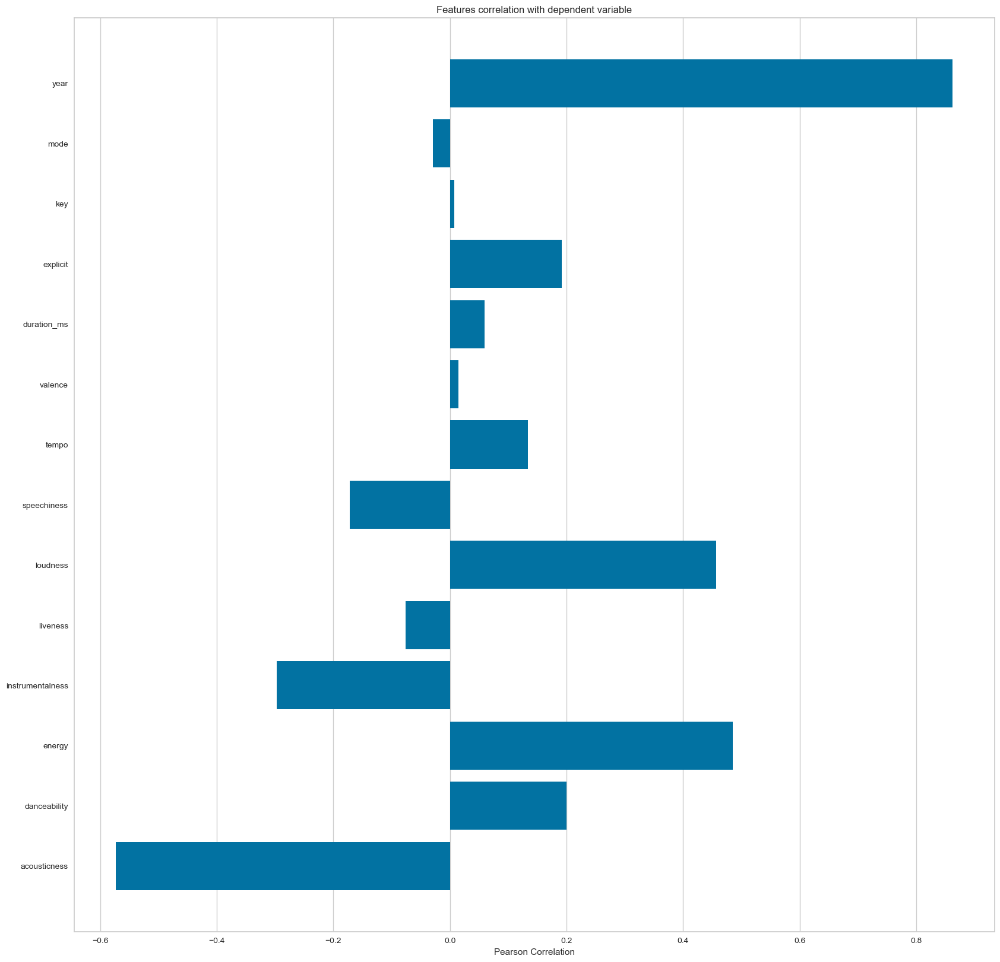

<Axes: title={'center': 'Features correlation with dependent variable'}, xlabel='Pearson Correlation'>

In [6]:

from yellowbrick.target import FeatureCorrelation

# Liste des caractéristiques à analyser
feature_names = ['acousticness', 'danceability', 'energy', 'instrumentalness',
       'liveness', 'loudness', 'speechiness', 'tempo', 'valence','duration_ms','explicit','key','mode','year']

# Séparation des caractéristiques de la cible
X, y = data[feature_names], data['popularity']

# Création d'une liste avec les noms des caractéristiques
features = np.array(feature_names)

# Instanciation du visualiseur pour analyser la corrélation des caractéristiques
visualizer = FeatureCorrelation(labels=features)

# Paramètres pour la taille de la figure
plt.rcParams['figure.figsize']=(20,20)

# Adapter les données au visualiseur
visualizer.fit(X, y) 

# Afficher le graphique   
visualizer.show()

# **Compréhension des données par la visualisation et l'exploration (EDA)**

# **La musique à travers le temps**

En utilisant les données regroupées par année (*data_by_year.csv*), nous pouvons comprendre comment la musique a évolué de 1921 à 2020.

<Axes: xlabel='decade', ylabel='count'>

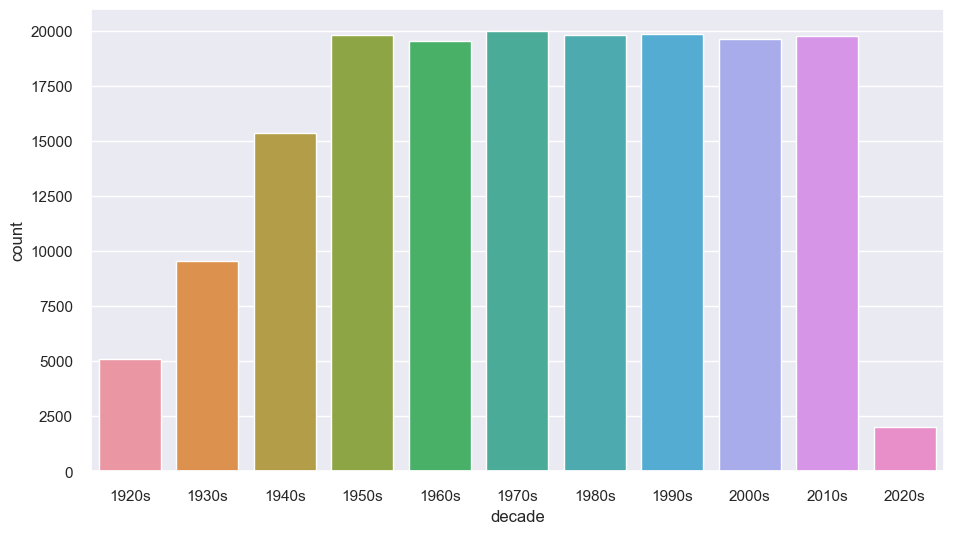

In [7]:
def get_decade(year):
    # Calcul de l'année de début de la décennie
    period_start = int(year/10) * 10
    decade = '{}s'.format(period_start)
    return decade

# Appliquer la fonction pour obtenir la décennie correspondante pour chaque année
data['decade'] = data['year'].apply(get_decade)

# Paramètres pour la taille du graphique
sns.set(rc={'figure.figsize':(11 ,6)})

# Afficher le nombre des musiques par décennie
sns.countplot(x= data['decade'])


In [8]:
# Liste des caractéristiques sonores à visualiser
sound_features = ['acousticness', 'danceability', 'energy', 'instrumentalness', 'liveness', 'valence']

# Création d'un graphique linéaire avec Plotly Express pour les caractéristiques sonores au fil des années
fig = px.line(year_data, x='year', y=sound_features)

# Affichage du graphique
fig.show()

# **Caractéristiques des différents genres**


Ce jeu de données contient les caractéristiques audio de différentes chansons ainsi que les caractéristiques audio de différents genres. Nous pouvons utiliser ces informations pour comparer différents genres et comprendre leurs différences uniques en termes de son.

In [9]:
# Sélection des 10 genres les plus populaires
top10_genres = genre_data.nlargest(10, 'popularity')

# Création d'un graphique à barres pour les caractéristiques musicales des 10 genres les plus populaires
fig = px.bar(top10_genres, x='genres', y=['valence', 'energy', 'danceability', 'acousticness'], barmode='group')

# Afficher le graphique
fig.show()

# **Regroupement des genres avec K-Means**


Ici, l'algorithme de regroupement K-Means simple est utilisé pour diviser les genres de cet ensemble de données en 10 clusters en se basant sur les caractéristiques audio numériques de chaque genre.

In [10]:

# Création d'un pipeline pour la mise à l'échelle et le modèle KMeans
cluster_pipeline = Pipeline([('scaler', StandardScaler()), ('kmeans', KMeans(n_clusters=10))])

# Sélection des colonnes numériques pour l'entraînement du modèle
X = genre_data.select_dtypes(np.number)

# Entraînement du pipeline
cluster_pipeline.fit(X)

# Prédiction des clusters et assignation au DataFrame 'genre_data'
genre_data['cluster'] = cluster_pipeline.predict(X)

In [11]:
# Visualizing the Clusters with t-SNE

# Création d'un pipeline pour la mise à l'échelle et la réduction de dimension avec t-SNE
tsne_pipeline = Pipeline([('scaler', StandardScaler()), ('tsne', TSNE(n_components=2, verbose=1))])

# Réduction de dimension avec t-SNE et création d'un DataFrame de projection
genre_embedding = tsne_pipeline.fit_transform(X)
projection = pd.DataFrame(columns=['x', 'y'], data=genre_embedding)
projection['genres'] = genre_data['genres']
projection['cluster'] = genre_data['cluster']

# Création d'un graphique de dispersion interactif avec Plotly Express
fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'genres'])

# Affichage du graphique
fig.show()

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2973 samples in 0.009s...
[t-SNE] Computed neighbors for 2973 samples in 0.338s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2973
[t-SNE] Computed conditional probabilities for sample 2000 / 2973
[t-SNE] Computed conditional probabilities for sample 2973 / 2973
[t-SNE] Mean sigma: 0.777516
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.106270
[t-SNE] KL divergence after 1000 iterations: 1.393243


# **Regroupement des chansons avec K-Means**

In [12]:
# Création d'un pipeline pour la mise à l'échelle et le modèle KMeans pour la segmentation des chansons
song_cluster_pipeline = Pipeline([('scaler', StandardScaler()), 
                                  ('kmeans', KMeans(n_clusters=20, 
                                   verbose=False))
                                 ], verbose=False)

# Sélection des colonnes numériques pour l'entraînement du modèle
X = data.select_dtypes(np.number)
number_cols = list(X.columns)

# Entraînement du pipeline
song_cluster_pipeline.fit(X)

# Prédiction des clusters et assignation au DataFrame 'data'
song_cluster_labels = song_cluster_pipeline.predict(X)
data['cluster_label'] = song_cluster_labels

In [13]:

# Création d'un pipeline pour la mise à l'échelle et la réduction de dimension avec ACP
pca_pipeline = Pipeline([('scaler', StandardScaler()), ('PCA', PCA(n_components=2))])

# Réduction de dimension avec PCA et création d'un DataFrame de projection
song_embedding = pca_pipeline.fit_transform(X)
projection = pd.DataFrame(columns=['x', 'y'], data=song_embedding)
projection['title'] = data['name']
projection['cluster'] = data['cluster_label']

# Création d'un graphique de dispersion interactif avec Plotly Express
fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'title'])

# Affichage du graphique
fig.show()

# **Construire un système de recommandation**

* Selon l'analyse et les visualisations, il est clair que des genres similaires ont tendance à avoir des points de données situés à proximité les uns des autres, tandis que des types de chansons similaires sont également regroupés ensemble.
* Cette observation est parfaitement logique. Des genres similaires auront des sonorités similaires et viendront de périodes similaires, tout comme les chansons à l'intérieur de ces genres. Nous pouvons utiliser cette idée pour construire un système de recommandation en prenant les points de données des chansons qu'un utilisateur a écoutées et en recommandant des chansons correspondant à des points de données proches.
* [Spotipy](https://spotipy.readthedocs.io/en/2.16.1/) est un client Python pour l'API Web de Spotify qui facilite aux développeurs la récupération de données et l'interrogation du catalogue de Spotify pour des chansons. Vous devez l'installer en utilisant `pip install spotipy`
* Après avoir installé Spotipy, vous devrez créer une application sur la  [Spotify Developer’s page](https://developer.spotify.com/) et enregistrer votre ID client et votre clé secrète.







In [ ]:
#Ce code utilise la commande pip pour installer le package spotipy, 
#permettant ainsi l'accès aux fonctionnalités de l'API Spotify dans votre environnement Python.
%pip install spotipy

In [14]:
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
from collections import defaultdict

# Assurez-vous de remplacer cette ligne par votre client ID et votre Secret Key
# Initialisation de l'objet Spotify avec l'authentification via le client ID et le Secret Key
sp = spotipy.Spotify(auth_manager=SpotifyClientCredentials(client_id="your client_id", client_secret="your secret key"))

sp = spotipy.Spotify(auth_manager=SpotifyClientCredentials(client_id="cb9fac5f9bb249c2a87c5f47e44137b5", client_secret="2a9406fa1f1b42e0a7fdca2d4224931e"))

def find_song(name, year):
    # Initialisation d'un dictionnaire pour stocker les données de la chanson
    song_data = defaultdict()

    # Recherche de la chanson spécifique par son nom et son année
    results = sp.search(q= 'track: {} year: {}'.format(name,year), limit=1)

    # Vérification si la chanson a été trouvée
    if results['tracks']['items'] == []:
        return None
    
    # Récupération des détails de la chanson
    results = results['tracks']['items'][0]
    track_id = results['id']
    audio_features = sp.audio_features(track_id)[0]

    # Stockage des informations de la chanson dans un dictionnaire
    song_data['name'] = [name]
    song_data['year'] = [year]
    song_data['explicit'] = [int(results['explicit'])]
    song_data['duration_ms'] = [results['duration_ms']]
    song_data['popularity'] = [results['popularity']]

    # Stockage des caractéristiques audio dans le dictionnaire
    for key, value in audio_features.items():
        song_data[key] = value
        
    # Retourne les données de la chanson sous forme de DataFrame pandas
    return pd.DataFrame(song_data)

In [15]:
from collections import defaultdict
import difflib

# Colonnes contenant des données numériques
number_cols = ['valence', 'year', 'acousticness', 'danceability', 'duration_ms', 'energy', 'explicit',
 'instrumentalness', 'key', 'liveness', 'loudness', 'mode', 'popularity', 'speechiness', 'tempo']

# Récupère les données d'une chanson à partir de Spotify ou de la base de données locale
def get_song_data(song, spotify_data):
    # Vérifie si la chanson est présente dans les données Spotify ou dans la base de données locale
    try:
        song_data = spotify_data[(spotify_data['name'] == song['name']) 
                                & (spotify_data['year'] == song['year'])].iloc[0]
        return song_data
    
    except IndexError:
        # Si la chanson n'est pas trouvée, utilise la fonction find_song pour la chercher sur Spotify
        return find_song(song['name'], song['year'])
        
# Calcule le vecteur moyen des caractéristiques des chansons dans une liste
def get_mean_vector(song_list, spotify_data):
    
    song_vectors = []

    # Récupère les vecteurs de caractéristiques pour chaque chanson dans la liste
    for song in song_list:
        song_data = get_song_data(song, spotify_data)
        if song_data is None:
            print('Warning: {} does not exist in Spotify or in database'.format(song['name']))
            continue
        song_vector = song_data[number_cols].values
        song_vectors.append(song_vector)  

    # Calcul du vecteur moyen des chansons
    song_matrix = np.array(list(song_vectors))
    return np.mean(song_matrix, axis=0)


# Aplatit une liste de dictionnaires en un seul dictionnaire
def flatten_dict_list(dict_list):
    
    flattened_dict = defaultdict()
    for key in dict_list[0].keys():
        flattened_dict[key] = []
    
    for dictionary in dict_list:
        for key, value in dictionary.items():
            flattened_dict[key].append(value)
            
    return flattened_dict


# Recommande des chansons en fonction d'une liste de chansons données
def recommend_songs( song_list, spotify_data, n_songs=10):
    
    metadata_cols = ['name', 'year', 'artists']
    song_dict = flatten_dict_list(song_list)
    
        # Calcul du vecteur moyen pour les chansons de la liste donnée
    song_center = get_mean_vector(song_list, spotify_data)
        # Échelle des données pour la comparaison des distances
    scaler = song_cluster_pipeline.steps[0][1]
    scaled_data = scaler.transform(spotify_data[number_cols])
    scaled_song_center = scaler.transform(song_center.reshape(1, -1))

        # Calcul des distances de similarité avec la distance cosinus
    distances = cdist(scaled_song_center, scaled_data, 'cosine')
    index = list(np.argsort(distances)[:, :n_songs][0])
    
        # Récupération des chansons recommandées en évitant celles déjà dans la liste donnée
    rec_songs = spotify_data.iloc[index]
    rec_songs = rec_songs[~rec_songs['name'].isin(song_dict['name'])]
    return rec_songs[metadata_cols].to_dict(orient='records')

In [17]:
# Recommande des chansons similaires à "all eyes on me" sorti en 1996 en se basant sur les données de 'data'

recommend_songs([{'name': 'all eyes on me', 'year':1996}],data)

# 'all eyes on me' est une music du rap americain 'old school' realiser par l'artist '2PAC' , il est clair que les recommendations sont parfaits,
# ils inclus des chansons du rap du meme thème des rappeur tel que 'snoop dog','the notorious B.I.G', '50 Cent', 'Eminem' ...

[{'name': 'All Eyez On Me (ft. Big Syke)',
  'year': 1996,
  'artists': "['2Pac', 'Big Syke']"},
 {'name': 'Full Clip', 'year': 1999, 'artists': "['Gang Starr']"},
 {'name': 'All About U (ft. Nate Dogg, Snoop Dogg, Fatal, Yani Hadati)',
  'year': 1996,
  'artists': "['2Pac', 'Yani Hadati', 'Snoop Dogg', 'Nate Dogg', 'Fatal']"},
 {'name': 'One Shot 2 Shot', 'year': 2004, 'artists': "['Eminem', 'D12']"},
 {'name': 'Fight Night', 'year': 2014, 'artists': "['Migos']"},
 {'name': "Hit 'em Up", 'year': 2003, 'artists': "['2Pac']"},
 {'name': 'Fight Music', 'year': 2001, 'artists': "['D12']"},
 {'name': 'Nasty Girl (feat. Diddy, Nelly, Jagged Edge & Avery Storm) - 2005 Remaster',
  'year': 2005,
  'artists': "['The Notorious B.I.G.', 'Avery Storm', 'Diddy', 'Jagged Edge', 'Nelly']"},
 {'name': 'Disco Inferno', 'year': 2005, 'artists': "['50 Cent']"},
 {'name': 'Purple Pills', 'year': 2001, 'artists': "['D12']"}]

In [79]:
recommend_songs([{'name': 'ne me quitte pas', 'year':2004}],data)

[{'name': 'Ne me quitte pas', 'year': 2004, 'artists': "['Jacques Brel']"},
 {'name': "Where's My Love - Alternate Version",
  'year': 2016,
  'artists': "['SYML']"},
 {'name': 'Perfectly Wrong', 'year': 2018, 'artists': "['Shawn Mendes']"},
 {'name': 'Train Song',
  'year': 2009,
  'artists': "['Feist', 'Benjamin Gibbard']"},
 {'name': 'Hallelujah', 'year': 2016, 'artists': "['Tori Kelly']"},
 {'name': 'Che Vuole Questa Musica Stasera',
  'year': 2003,
  'artists': "['Armando Trovajoli']"},
 {'name': 'Cielo Rojo', 'year': 1991, 'artists': "['Flor Silvestre']"},
 {'name': 'La chanson des vieux amants',
  'year': 1988,
  'artists': "['Jacques Brel']"},
 {'name': 'John Wayne Gacy, Jr.',
  'year': 2005,
  'artists': "['Sufjan Stevens']"},
 {'name': 'Give Me the Simple Life - From Father of the Bride, Pt. II',
  'year': 1999,
  'artists': "['Steve Tyrell']"}]

In [19]:
recommend_songs([{'name': 'Easy On Me (Official Video)', 'year':2022}],data)

[{'name': 'O, I Love You', 'year': 2011, 'artists': "['Essie Jain']"},
 {'name': 'Christmas Time Is Here',
  'year': 2011,
  'artists': "['Eric Lugosch']"},
 {'name': "I Feel My Savior's Love",
  'year': 2000,
  'artists': "['Paul Cardall']"},
 {'name': 'Golden Slumbers/Over the Rainbow - Instrumental',
  'year': 2005,
  'artists': "['Fred Mollin']"},
 {'name': 'Song for A', 'year': 2016, 'artists': "['Charlie Key']"},
 {'name': 'Auld Lang Syne', 'year': 2016, 'artists': "['Samuel Bath']"},
 {'name': 'Just the Way You Are',
  'year': 2013,
  'artists': "['The Piano Guys']"},
 {'name': 'For Ross', 'year': 2008, 'artists': "['Thad Fiscella']"},
 {'name': 'Hallelujah', 'year': 2011, 'artists': "['Brian Crain']"},
 {'name': 'Precious Life (Instrumental)',
  'year': 2009,
  'artists': "['Scripture Lullabies']"}]